# Census Income- Análise

Este conjunto de dados contém informações demográficas e socioeconômicas de indivíduos, extraídas do Censo dos Estados Unidos de 1994, e é projetado para prever se um indivíduo ganha mais ou menos de $50.000 por ano, de acordo com variáveis específicas.

<a id="import_bibliotecas"></a>
<h1 style="color: green;">1. Importando as bibliotecas e o dataset</h1>

In [1]:
# Importando a biblioteca para manipulação de bases de dados
import pandas as pd

#Importando a biblioteca para manipulação algébrica
import numpy as np

# Bibliotecas para a EDA
import missingno
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

# Visualização de gráficos interativos
from plotly.io import write_image

# Estatística
from scipy.stats import skew
from scipy.stats import chi2_contingency
from scipy.stats import ttest_ind
from statsmodels.stats.proportion import proportions_ztest
from scipy.stats import kruskal

# Balanceamento
from imblearn.over_sampling import SMOTE

# Tratamento Categóricas
import category_encoders as ce

# Pipeline
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# Configurar para não exibir warnings
from warnings import filterwarnings
filterwarnings('ignore')

# Exibindo todas as colunas das bases de dados
pd.set_option('display.max_columns', None)

# Ajustando a configuração de exibição do Pandas para mostrar todo o conteúdo das colunas
pd.set_option('display.max_colwidth', None)

In [2]:
# Importando bases de dados

adult_train = pd.read_csv('adult.data', header=None)
adult_test = pd.read_csv('adult.test')

with open('old.adult.names', 'r') as file:
    lines = file.readlines()

<a id="atribuicao_variaveis"></a>
<h1 style="color: green;">2. Atribuição das Variáveis</h1>

Como os nomes das variáveis estão embutidos no arquivo `old.adult.names`, então precisamos coletá-los através de algumas manipulações em Python.

In [3]:
# Procurando pela linha que contém 'Attribute Information:'
found_section = False
for i, line in enumerate(lines):
    if 'Attribute Information:' in line:
        start_index = i
        found_section = True
        break

# Verificando se a seção foi encontrada
if found_section:
    print("Seção 'Attribute Information:' encontrada na linha", start_index)
    
    # Extraindo os nomes das colunas a partir da linha encontrada
    column_names = []
    for line in lines[start_index + 1:]:
        # Parar a extração se encontrar a próxima seção (número 8, por exemplo)
        if line.strip().startswith('8.'):
            break
        # Verificando se a linha contém um atributo (tem ':' no meio)
        if ':' in line:
            attribute_name = line.strip().split(':')[0]
            column_names.append(attribute_name)
    print(column_names)
    
adult_train.columns = column_names
adult_test = adult_test.reset_index()
adult_test.columns = column_names

Seção 'Attribute Information:' encontrada na linha 61
['age', 'workclass', 'fnlwgt', 'education', 'education-num', 'marital-status', 'occupation', 'relationship', 'race', 'sex', 'capital-gain', 'capital-loss', 'hours-per-week', 'native-country', 'class']


As variáveis encontradas podem ser descritas da seguinte forma:

**age:** Idade  
**workclass:** Tipo de emprego, como setor privado, governo local, etc  
**fnlwgt:** Peso final da amostra  
**education:** Grau de instrução, como bacharelado, ensino médio completo, etc  
**education-num:** Número de anos de educação  
**marital-status:** Estado civil, como casado, solteiro, divorciado, etc  
**occupation:** Tipo de ocupação, como técnico, gerência executiva, serviços de venda, etc  
**relationship:** Relação familiar, como cônjuge, filho, etc  
**race:** Etnia  
**sex:** Gênero (masculino ou feminino)  
**capital-gain:** Renda recebida de investimentos  
**capital-loss:** Perda de capital de investimentos  
**hours-per-week:** Horas de trabalho por semana  
**native-country:** País de origem  

<h2 style='color: red;'>Atenção!!</h2>
Antes de avançar na análise vamos corrigir um pequeno problema nas bases, que é referente à coluna `class`. No caso da base de teste estão sendo mostrados `>50K.` (ao invés de `>50K`) e `<=50K.` (ao invés de `<=50K`). As correções serão feitas já no próximo passo.

In [4]:
# Removendo espaços em branco e pontos finais dos valores nas colunas 'class'
adult_train['class'] = adult_train['class'].str.strip().str.replace('.', '', regex=False)
adult_test['class'] = adult_test['class'].str.strip().str.replace('.', '', regex=False)

In [5]:
# Concatenando as bases de dados de treino e teste
adult_data = pd.concat([adult_train, adult_test], axis=0).reset_index(drop=True)

<a id="visao_geral"></a>
<h1 style="color: green;">3. Visão Geral do Dataset</h1>

Aqui vamos trazer as primeiras impressões da base de dados.

In [6]:
# Primeiras linhas do dataset
adult_data.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,class
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [7]:
print(f"O dataframe possui {adult_data.shape[0]} linhas e {adult_data.shape[1]} colunas.")

O dataframe possui 48842 linhas e 15 colunas.


In [8]:
# Informações sobre todas as colunas do dataset
adult_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             48842 non-null  int64 
 1   workclass       48842 non-null  object
 2   fnlwgt          48842 non-null  int64 
 3   education       48842 non-null  object
 4   education-num   48842 non-null  int64 
 5   marital-status  48842 non-null  object
 6   occupation      48842 non-null  object
 7   relationship    48842 non-null  object
 8   race            48842 non-null  object
 9   sex             48842 non-null  object
 10  capital-gain    48842 non-null  int64 
 11  capital-loss    48842 non-null  int64 
 12  hours-per-week  48842 non-null  int64 
 13  native-country  48842 non-null  object
 14  class           48842 non-null  object
dtypes: int64(6), object(9)
memory usage: 5.6+ MB


In [9]:
numerics = ["int16", "int32", "int64", "float16", "float32", "float64"]

numericas = adult_data.select_dtypes(include=numerics)

nao_numericas = adult_data.select_dtypes(exclude=numerics)

print(f"Temos {numericas.shape[1]} colunas numéricas e {nao_numericas.shape[1]} colunas não-numéricas.")

Temos 6 colunas numéricas e 9 colunas não-numéricas.


In [10]:
# Estátísticas descritivas do dataset
adult_data.describe()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
count,48842.000000,4.884200e+04,48842.000000,48842.000000,48842.000000,48842.000000
mean,38.643585,1.896641e+05,10.078089,1079.067626,87.502314,40.422382
std,13.710510,1.056040e+05,2.570973,7452.019058,403.004552,12.391444
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.175505e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.781445e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.376420e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.490400e+06,16.000000,99999.000000,4356.000000,99.000000


Nesta etapa inicial, é importante a obtenção das estatísticas descritivas das variáveis numéricas, pois é uma checagem a mais para identificar possíveis erros operacionais nos dados. Por exemplo, se na variável **age** o valor máximo fosse `150`. É de se estranhar que uma pessoa tenha `150 anos`, possivelmente seria um erro.

<a id="outliers"></a>
#### <b>3.1 Detecção de Outliers</b>

Esta etapa consiste em detectar a quantidade de outliers presente em cada uma das variáveis da base de dados. São calculados utilizando Q1 (primeiro quartil), Q3 (terceiro quartil) e IQR (Distância Interquartil):

Q1: Este é o valor que separa os 25% menores valores da coluna. Também é conhecido como primeiro quartil.

Q3: Este é o valor que separa os 25% maiores valores da coluna. Também é conhecido como terceiro quartil.

$$IQR = Q3 - Q1$$
<br>
Será considerado Outlier quando o valor da variável (VAR):

$$VAR > Q3 + 1.5IQR$$
$$VAR < Q1 - 1.5IQR$$

In [11]:
# Função para identificar outliers em uma variável
def detect_outliers(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = column[(column < lower_bound) | (column > upper_bound)]
    return outliers

# Dicionário para armazenar os outliers de cada variável
outliers_dict = {}

# Loop através das variáveis numéricas
for col in adult_data.select_dtypes(include=['float64', 'int64']):
    outliers = detect_outliers(adult_data[col])
    outliers_dict[col] = outliers

# Crie um DataFrame com os outliers
outliers_df = pd.DataFrame(outliers_dict)

# Conte quantos outliers cada variável possui
contagem_outliers = outliers_df.count()

# Exiba a contagem de outliers para cada variável
contagem_outliers_df = pd.DataFrame({'Variavel': contagem_outliers.index, 'Quantidade de Outliers': contagem_outliers.values})
contagem_outliers_df

,Variavel,Quantidade de Outliers
0,age,216
1,fnlwgt,1453
2,education-num,1794
3,capital-gain,4035
4,capital-loss,2282
5,hours-per-week,13496


<a id="valores_nulos"></a>
#### <b>3.2 Valores Nulos</b>

In [12]:
# Fazendo a soma de valores nulos por coluna
adult_data.isnull().sum()

age               0
workclass         0
fnlwgt            0
education         0
education-num     0
marital-status    0
occupation        0
relationship      0
race              0
sex               0
capital-gain      0
capital-loss      0
hours-per-week    0
native-country    0
class             0
dtype: int64

In [13]:
adult_data['workclass'].value_counts()

workclass
Private             33906
Self-emp-not-inc     3862
Local-gov            3136
?                    2799
State-gov            1981
Self-emp-inc         1695
Federal-gov          1432
Without-pay            21
Never-worked           10
Name: count, dtype: int64

In [14]:
adult_data['education'].value_counts()

education
HS-grad         15784
Some-college    10878
Bachelors        8025
Masters          2657
Assoc-voc        2061
11th             1812
Assoc-acdm       1601
10th             1389
7th-8th           955
Prof-school       834
9th               756
12th              657
Doctorate         594
5th-6th           509
1st-4th           247
Preschool          83
Name: count, dtype: int64

In [15]:
adult_data['marital-status'].value_counts()

marital-status
Married-civ-spouse       22379
Never-married            16117
Divorced                  6633
Separated                 1530
Widowed                   1518
Married-spouse-absent      628
Married-AF-spouse           37
Name: count, dtype: int64

In [16]:
adult_data['occupation'].value_counts()

occupation
Prof-specialty       6172
Craft-repair         6112
Exec-managerial      6086
Adm-clerical         5611
Sales                5504
Other-service        4923
Machine-op-inspct    3022
?                    2809
Transport-moving     2355
Handlers-cleaners    2072
Farming-fishing      1490
Tech-support         1446
Protective-serv       983
Priv-house-serv       242
Armed-Forces           15
Name: count, dtype: int64

In [17]:
adult_data['native-country'].value_counts()

native-country
United-States                 43832
Mexico                          951
?                               857
Philippines                     295
Germany                         206
Puerto-Rico                     184
Canada                          182
El-Salvador                     155
India                           151
Cuba                            138
England                         127
China                           122
South                           115
Jamaica                         106
Italy                           105
Dominican-Republic              103
Japan                            92
Guatemala                        88
Poland                           87
Vietnam                          86
Columbia                         85
Haiti                            75
Portugal                         67
Taiwan                           65
Iran                             59
Greece                           49
Nicaragua                        49
Peru         

<h2 style='color: red;'>Atenção!!</h2>

Percebeu que, para algumas variáveis, aparece um `ponto de interrogação (?)` no lugar do nome da categoria? Pois bem, aqui vamos precisar corrigir insirindo `NaN`, já que se trata de um valor desconhecido.

In [18]:
# Substituindo os valores faltantes por np.nan
adult_data = adult_data.applymap(lambda x: x.strip() if isinstance(x, str) else x)
adult_data = adult_data.replace(['?'], np.nan)

# Fazendo a soma de valores nulos por coluna
adult_data.isnull().sum()

age                  0
workclass         2799
fnlwgt               0
education            0
education-num        0
marital-status       0
occupation        2809
relationship         0
race                 0
sex                  0
capital-gain         0
capital-loss         0
hours-per-week       0
native-country     857
class                0
dtype: int64

Podemos identificar a presença de valores nulos através de uma forma mais visual, no caso da Figura abaixo. Cada coluna é representada por uma barra, as barras que contém traços brancos horizontais são aquelas com valores nulos.

<Axes: >

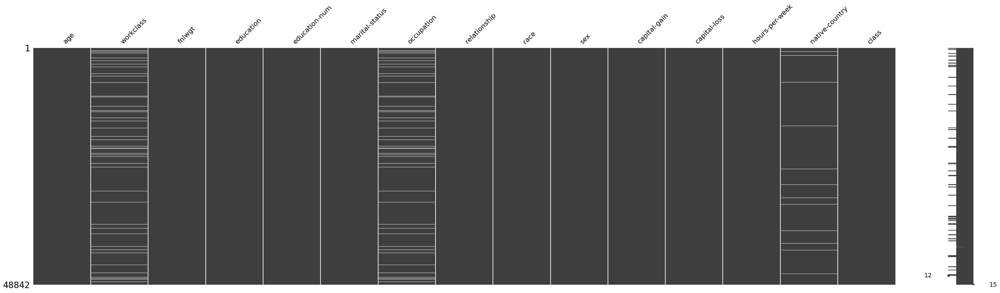

In [19]:
# visualizando as colunas com dados faltantes
missingno.matrix(adult_data,figsize=(40,10))

A visualização do percentual de nulos também pode ajudar a identificar o impacto sofrido pela ausência de valores em cada variável.

In [20]:
# fazendo unpack de linhas e colunas
rows, columns = adult_data.shape

# Percentual de dados faltantes por coluna
percentual_nan = ((adult_data.isnull().sum()/rows) * 100).round(2)
percentual_nan

age               0.00
workclass         5.73
fnlwgt            0.00
education         0.00
education-num     0.00
marital-status    0.00
occupation        5.75
relationship      0.00
race              0.00
sex               0.00
capital-gain      0.00
capital-loss      0.00
hours-per-week    0.00
native-country    1.75
class             0.00
dtype: float64

<a id="linhas_duplicadas"></a>
#### <b>3.3 Linhas Duplicadas</b>

Antes de prosseguir é importante verificar se há a existência de linhas duplicatas na base, que podem `sujar` a análise. Caso identificadas, devem ser excluídas.

In [21]:
# verificando se há linhas duplicadas
adult_data[adult_data.duplicated()]

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,class
4881,25,Private,308144,Bachelors,13,Never-married,Craft-repair,Not-in-family,White,Male,0,0,40,Mexico,<=50K
5104,90,Private,52386,Some-college,10,Never-married,Other-service,Not-in-family,Asian-Pac-Islander,Male,0,0,35,United-States,<=50K
9171,21,Private,250051,Some-college,10,Never-married,Prof-specialty,Own-child,White,Female,0,0,10,United-States,<=50K
11631,20,Private,107658,Some-college,10,Never-married,Tech-support,Not-in-family,White,Female,0,0,10,United-States,<=50K
13084,25,Private,195994,1st-4th,2,Never-married,Priv-house-serv,Not-in-family,White,Female,0,0,40,Guatemala,<=50K
15059,21,Private,243368,Preschool,1,Never-married,Farming-fishing,Not-in-family,White,Male,0,0,50,Mexico,<=50K
17040,46,Private,173243,HS-grad,9,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,40,United-States,<=50K
18555,30,Private,144593,HS-grad,9,Never-married,Other-service,Not-in-family,Black,Male,0,0,40,NaN,<=50K
18698,19,Private,97261,HS-grad,9,Never-married,Farming-fishing,Not-in-family,White,Male,0,0,40,United-States,<=50K
21318,19,Private,138153,Some-college,10,Never-married,Adm-clerical,Own-child,White,Female,0,0,10,United-States,<=50K


In [22]:
# Retirando as duplicatas
adult_data = adult_data.drop_duplicates()

# verificando se há linhas duplicadas
adult_data[adult_data.duplicated()]

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,class


<a id="valores_diferentes_por_coluna"></a>
#### <b>3.4 Valores Diferentes por Coluna</b>

Verificar os valores diferentes por coluna nos ajuda a conhecer um pouco mais das variáveis da base.

In [23]:
# Definindo quantos valores diferentes existem em cada variável

contagem = pd.DataFrame(columns=['Variavel','Contagens_Distintas'])

for coluna in adult_data.columns:
    dados = pd.DataFrame({'Variavel': [coluna], 'Contagens_Distintas': [adult_data[coluna].value_counts().shape[0]]})
    contagem = pd.concat([contagem, dados], ignore_index = True)

contagem

,Variavel,Contagens_Distintas
0,age,74
1,workclass,8
2,fnlwgt,28523
3,education,16
4,education-num,16
5,marital-status,7
6,occupation,14
7,relationship,6
8,race,5
9,sex,2


Com a informação das contagens distintas de cada variável, podemos obter as seguintes informações:  
* Há 8 tipos diferentes de workclass 
* Há 16 tipos diferentes de education
* Há 7 tipos diferentes de marital-status
* Há 14 tipos diferentes de occupation
* Há 41 tipos diferentes de native-country
* Há 6 tipos diferentes de relationship
* Há 5 tipos diferentes de raça
* Há 2 classes diferentes de renda

<a id="analise_exploratoria"></a>
<h1 style="color: green;">4. Análise Exploratória dos Dados</h1>

Agora vamos começar uma `Análise Exploratória` afim de entender melhor as relações nos dados, utilizando de ferramentas visuais e métodos estatísticos, antes de proseguir com eventuais modelagens utilizando de machine learning. Para isso, vamos buscar responder algumas perguntas de negócio:

###### <a id="pergunta_1"></a>
### <b>4.1 Como o nível de escolaridade afeta a probabilidade de uma pessoa ganhar mais de $50.000 por ano?</b>

In [24]:
# Calculando a proporção de pessoas que ganham >50K em cada nível de escolaridade
education_income = adult_data.groupby('education')['class'].value_counts(normalize=True).unstack().fillna(0)

# Convertendo para porcentagem
education_income['>50K'] = (education_income['>50K'] * 100).round(2)  

# Ordenando por proporção de >50K
education_income = education_income.sort_values(by='>50K', ascending=False)
education_income = education_income.reset_index()

In [25]:
fig = px.bar(education_income, x='education', y='>50K', color='education', 
    title='Distribuição de Renda por Nível de Educação',
    text='>50K',
    labels={'education': 'Educação', '>50K': 'Proporção (%)'}
)
fig.update_traces(textposition='outside', texttemplate='%{text}', textfont_size=12)
fig.update_layout(height=500)
fig.show()

Podemos ver que, indivíduos que fizeram um curso técnico (Prof-school ou Professional School) são aqueles que apresentam maior proporção de rendas superiores a $50.000, seguidos por aqueles com doutorado (Doctorate) e mestrado (Masters). Isso **pode** indicar que níveis de educação mais elevados ou específicos, como cursos técnicos profissionais, estão associados a uma maior proporção de rendas mais altas.


###### <a id="pergunta_2"></a>
### <b>4.2 Qual é a distribuição de renda entre diferentes faixas etárias?</b>

In [26]:
# Agrupando por faixa etária e calculando a proporção de pessoas que ganham >50K
age_income = adult_data.groupby('age')['class'].value_counts(normalize=True).unstack().fillna(0)

# Convertendo para porcentagem
age_income['>50K'] = age_income['>50K'] * 100  

In [27]:
# Criando o gráfico interativo com plotly
fig = px.line(age_income, x=age_income.index, y='>50K',
              title='Proporção de pessoas que ganham >50K por faixa etária',
              labels={'age': 'Idade', 'value': 'Porcentagem de renda (%)', 'variable': 'Renda'})

fig.update_layout(xaxis_title='Idade',
                  yaxis_title='Porcentagem de pessoas (%)')

fig.show()

Podemos visualizar também em formato de histograma:

In [65]:
fig = px.histogram(adult_data, x='age', color='class',
                   title='Distribuição de Idade por Faixa de Renda',
                   labels={'age': 'Idade', 'class': 'Faixa de Renda'},
                   barmode='overlay', nbins=50)
fig.show()

Com o histograma acima podemos concluir:

* A maioria das pessoas com renda <=50K está concentrada nas faixas etárias mais jovens, principalmente entre 20 e 40 anos. Isso pode indicar que é menos comum pessoas mais jovens terem cargos elevados
* A distribuição de indivíduos com renda >50K aumenta gradualmente conforme a idade avança, alcançando um pico em torno dos 40 a 50 anos
* Acima dos 60 anos, a quantidade de indivíduos com renda >50K diminui, o que pode estar relacionado à aposentadoria ou a uma menor participação ativa no mercado de trabalho

Com isso pode vir a pergunta: **"Será que podemos afirmar para toda a população que a média de idade de indivíduos com renda > 50K é maior que a média de idade de indivíduos com renda <=50K>?"** Para responder esta pergunta, utilizamos um teste de hipótese, através do teste t:

**- Hipóteses H0 e H1**  

**Hipótese Nula (H0):** A média de idade de indivíduos com renda >50K é menor ou igual à média de idade de indivíduos com renda <=50K  
**Hipótese Alternativa (H1):** A média de idade de indivíduos com renda >50K é maior do que a média de idade de indivíduos com renda <=50K

In [29]:
# Dividindo os grupos: idade de pessoas com renda <=50K e >50K
age_low_income = adult_data[adult_data['class'] == '<=50K']['age']
age_high_income = adult_data[adult_data['class'] == '>50K']['age']

# Realizando o teste t
t_stat, p_value = ttest_ind(age_high_income,age_low_income, alternative='greater', nan_policy='omit')

print(f'T-statistic: {t_stat:.2f}, p-value: {p_value:.5f}')

# Interpretação
alpha = 0.05  # Nível de significância
if p_value < alpha:
    print("Rejeitamos a hipótese nula. A média de idade de indivíduos com renda >50K é significativamente maior do que a de indivíduos com renda <=50K.")
else:
    print("Não rejeitamos a hipótese nula. Não há evidência suficiente para afirmar que a média de idade de indivíduos com renda >50K é maior do que a de indivíduos com renda <=50K.")

T-statistic: 52.24, p-value: 0.00000
Rejeitamos a hipótese nula. A média de idade de indivíduos com renda >50K é significativamente maior do que a de indivíduos com renda <=50K.


###### <a id="pergunta_3"></a>
### <b>4.3 Quais são as ocupações com a maior proporção de pessoas que ganham mais de $50.000 por ano?</b>

In [30]:
# Calculando a proporção de pessoas que ganham >50K em cada ocupação
occupation_income = adult_data.groupby('occupation')['class'].value_counts(normalize=True).unstack().fillna(0)
occupation_income['>50K'] = (occupation_income['>50K'] * 100).round(2)  # Convertendo para porcentagem
occupation_income['<=50K'] = (occupation_income['<=50K'] * 100).round(2)

In [31]:
# Ordenando por proporção de >50K
occupation_income = occupation_income.sort_values(by='>50K', ascending=False).reset_index()

# Criando o gráfico
fig = px.bar(occupation_income, x='>50K', y='occupation', orientation='h',
             title='Proporção de pessoas que ganham >50K por ocupação',
             labels={'occupation': 'Ocupação', '>50K': 'Porcentagem de renda >50K (%)'},
             text='>50K')

fig.update_layout(xaxis_title='Porcentagem de pessoas com renda >50K (%)',
                  yaxis_title='Ocupação',
                  yaxis={'categoryorder':'total ascending'}, height=500)

fig.show()

Podemos ver que cargos de alta gestão (Exec-managerial), alta especialização (Prof-specialty) lideram com folga a proporção de indivíduos que ganham >50K. Enquanto que profissionais da limpeza (Handlers-cleaners) e serviços domésticos (Priv-house-serv) têm as menores proporções, reforçando a ideia de que profissões com menor nível de especialização possuem menor remuneração.

###### <a id="pergunta_4"></a>
### <b>4.4 Existe diferença na distribuição de renda entre homens e mulheres?</b>

In [32]:
# Calculando a proporção de pessoas que ganham >50K por gênero
gender_income = adult_data.groupby('sex')['class'].value_counts(normalize=True).unstack().fillna(0)
gender_income['>50K'] = (gender_income['>50K'] * 100).round(2)  # Convertendo para porcentagem
gender_income['<=50K'] = gender_income['<=50K'] * 100


In [33]:
# Criando o gráfico interativo com plotly
fig = px.bar(gender_income, x=gender_income.index, y='>50K',
             title='Proporção de pessoas que ganham >50K por gênero',
             labels={'sex': 'Gênero', '>50K': 'Porcentagem de renda >50K (%)'},
             text='>50K',
             color=gender_income.index)

fig.update_layout(xaxis_title='Gênero',
                  yaxis_title='Porcentagem de renda >50K (%)')

fig.show()

A proporção de homens que ganham mais de 50K (30.39%) é significativamente maior do que a proporção de mulheres que ganham mais de 50K (10.94%). Isso indica uma disparidade de gênero em relação a rendas elevadas. 

Aí vem a pergunta:**"Será que podemos expandir esse racional para a população? Será que a renda está significativamente relacionada com o gênero?"** Para responder esta pergunta vamos utilizar um teste de hipótese, através do teste do Chi-quadrado:

**- Hipóteses**

**Hipótese Nula (H0):** Não há associação entre o gênero e a faixa de renda. Em outras palavras, a distribuição de renda (<=50K ou >50K) é independente do gênero  
**Hipótese Alternativa (H1):** Existe uma associação entre o gênero e a faixa de renda. Ou seja, a distribuição de renda depende do gênero

In [34]:
# Criando uma tabela de contingência
contingency_table = pd.crosstab(adult_data['sex'], adult_data['class'])

# Realizando o teste qui-quadrado
chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f'Chi-square: {chi2}, p-value: {p}')

# Interpretando o resultado
if p < 0.05:
    print("Há uma associação estatisticamente significativa entre o gênero e a faixa de renda.")
else:
    print("Não há uma associação estatisticamente significativa entre o gênero e a faixa de renda.")

Chi-square: 2246.689291115775, p-value: 0.0
Há uma associação estatisticamente significativa entre o gênero e a faixa de renda.


###### <a id="pergunta_5"></a>
### <b>4.5 Como a origem do país afeta a probabilidade de uma pessoa ganhar mais de $50.000 por ano?</b>

In [35]:
# Calculando a proporção de pessoas que ganham >50K por país de origem
country_income = adult_data.groupby('native-country')['class'].value_counts(normalize=True).unstack().fillna(0)
country_income['>50K'] = (country_income['>50K'] * 100).round(2)  # Convertendo para porcentagem

# Ordenando por proporção de >50K
country_income = country_income.sort_values(by='>50K', ascending=False).reset_index()
country_income = country_income.head(10)

In [36]:
# Criando o gráfico interativo com plotly
fig = px.bar(country_income, x='native-country', y='>50K',
             title='Proporção de pessoas que ganham >50K por país de origem',
             labels={'native-country': 'País de Origem', '>50K': 'Porcentagem de renda >50K (%)'},
             text='>50K', color='native-country')

fig.update_layout(xaxis_title='País de Origem',
                  yaxis_title='Porcentagem de pessoas com renda >50K (%)',
                  xaxis={'categoryorder':'total descending'},
                  height=600)  # Aumentando a altura do gráfico

fig.show()

França, Índia e Taiwan são os países que apresentam as maiores proporções de pessoas com renda superior a 50K, com valores em torno de 40% ou mais. Isso pode ser um indicativo de que indivíduos provenientes destes países têm mais chances de ocupar cargos bem remunerados.

Pergunta: **"Será que há uma relação significativa entre o país de origem e a renda?"** Aqui também utilizamos o teste do Chi-Quadrado para responder:

**- Hipóteses:**

**Hipótese Nula (H0):** Não há associação entre o país de origem e a faixa de renda. Em outras palavras, a distribuição de renda (<=50K e >50K) é independente do país de origem  
**Hipótese Alternativa (H1):** Existe uma associação entre o país de origem e a faixa de renda. Ou seja, a distribuição de renda depende do país de origem

In [37]:
# Criando uma tabela de contingência
contingency_table = pd.crosstab(adult_data['native-country'], adult_data['class'])

# Realizando o teste qui-quadrado
chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f'Chi-square: {chi2}, p-value: {p}')

# Interpretando o resultado
if p < 0.05:
    print("Há uma associação estatisticamente significativa entre o país de origem e a faixa de renda.")
else:
    print("Não há uma associação estatisticamente significativa entre o país de origem e a faixa de renda.")

Chi-square: 448.33414989808585, p-value: 1.817676544031425e-70
Há uma associação estatisticamente significativa entre o país de origem e a faixa de renda.


###### <a id="pergunta_6"></a>
### <b>4.6 Como é a distribuição de horas trabalhadas por gênero e faixa de renda?</b>

In [38]:
fig = px.box(adult_data, x='sex', y='hours-per-week', color='class',
             title='Distribuição de Horas Trabalhadas por Semana por Gênero e Faixa de Renda',
             labels={'sex': 'Gênero', 'hours-per-week': 'Horas por Semana', 'class': 'Faixa de Renda'})
fig.show()

Observando os boxplots, podemos concluir que, para esta amostra:

* Indivíduos que ganham mais de 50K tendem a trabalhar mais horas por semana, tanto para homens quanto para mulheres
* A faixa de valores de horas trabalhadas para homens com renda superior a 50K parece ser mais ampla do que para mulheres com a mesma faixa de renda
* A distribuição dos homens que ganham <=50K mostra que a grande maioria trabalha dentro de uma faixa menor de horas. Porém, a distribuição conta com muitos outliers tanto acima quanto abaixo

Podemos avaliar também se a quantidade de horas trabalhadas entre homens que ganham mais de $50.000 é significativamente maior do que a quantidade de horas trabalhadas por mulheres que também ganham mais de $50.000. Para isso usamos o teste t de Student.

**- Hipóteses:**

**Hipótese nula (H0):** A média de horas trabalhadas pelos homens (>50K) é igual ou menor do que a média de horas trabalhadas pelas mulheres (>50K)    
**Hipótese alternativa (H1):** A média de horas trabalhadas pelos homens (>50K) é maior do que a média de horas trabalhadas pelas mulheres (>50K)

In [39]:
# Dividindo os grupos: homens (>50K) e mulheres (>50K)
male_high_income = adult_data[(adult_data['sex'] == 'Male') & (adult_data['class'] == '>50K')]['hours-per-week']
female_high_income = adult_data[(adult_data['sex'] == 'Female') & (adult_data['class'] == '>50K')]['hours-per-week']

# Realizando o teste t
t_stat, p_value = ttest_ind(male_high_income, female_high_income, alternative='greater', nan_policy='omit')

print(f'T-statistic: {t_stat:.2f}, p-value: {p_value:.5f}')

# Interpretando o resultado
alpha = 0.05  # Nível de significância
if p_value < alpha:
    print("Rejeitamos a hipótese nula. Homens que ganham >50K trabalham significativamente mais horas que mulheres que ganham >50K.")
else:
    print("Não rejeitamos a hipótese nula. Não há evidência suficiente para afirmar que homens que ganham >50K trabalham mais horas que mulheres que ganham >50K.")

T-statistic: 19.99, p-value: 0.00000
Rejeitamos a hipótese nula. Homens que ganham >50K trabalham significativamente mais horas que mulheres que ganham >50K.


###### <a id="pergunta_7"></a>
### <b>4.7 Avaliando ganhos e perdas de capitais</b>

In [40]:
# Boxplot para 'capital-gain' por faixa de renda
fig = px.box(adult_data, x='class', y='capital-gain', title='Distribuição de Capital-Gain por Faixa de Renda',
             labels={'class': 'Faixa de Renda', 'capital-gain': 'Ganho de Capital'})
fig.show()

Pelo gráfico acima, podemos observar que:

* A maior parte dos valores de capital-gain está concentrada em zero para ambas as faixas de renda (Q1, Q2 e Q3 zerados), o que indica que a maioria dos indivíduos, independentemente da faixa de renda, não têm ganhos de capital significativos
* Temos outliers em ambas as distribuições, mas os valores mais extremos estão relacionados aos indivíduos que ganham >50K

Podemos utilizar um teste de hipótese (teste t) para verificar se as médias dos ganhos de capitais são significativamente diferentes nos dois grupos:

**- Hipóteses**  

**Hipótese Nula (H0):** A média de ganho de capital é igual entre os grupos de renda (<=50K e >50K). Ou seja, não há diferença significativa na média de ganho de capital entre os indivíduos que ganham menos ou igual a 50K e os que ganham mais de 50K  
**Hipótese Alternativa (H1):** A média de ganho de capital é diferente entre os grupos de renda (<=50K e >50K). Ou seja, há uma diferença significativa na média de capital-gain entre os indivíduos com diferentes faixas de renda.

In [41]:
# Dividindo os grupos de acordo com a renda
gain_low_income = adult_data[adult_data['class'] == '<=50K']['capital-gain']
gain_high_income = adult_data[adult_data['class'] == '>50K']['capital-gain']

In [42]:
print("Média de capital-gain para pessoas com renda <=50K:", gain_low_income.mean())
print("Média de capital-gain para pessoas com renda >50K:", gain_high_income.mean())

Média de capital-gain para pessoas com renda <=50K: 147.19254089304482
Média de capital-gain para pessoas com renda >50K: 4044.3158120023973


In [43]:
# Realizando o teste t
t_stat_gain, p_value_gain = ttest_ind(gain_low_income, gain_high_income, nan_policy='omit')

print(f'Capital-Gain - T-statistic: {t_stat_gain:.2f}, p-value: {p_value_gain:.5f}')

# Interpretação
alpha = 0.05
if p_value_gain < alpha:
    print("Rejeitamos a hipótese nula. A média de ganho de capital é significativamente diferente entre os grupos de renda.")
else:
    print("Não rejeitamos a hipótese nula. Não há diferença significativa na média de ganho de capital entre os grupos de renda.")

Capital-Gain - T-statistic: -50.54, p-value: 0.00000
Rejeitamos a hipótese nula. A média de ganho de capital é significativamente diferente entre os grupos de renda.


A mesma análise podemos fazer com as perdas de capital entre o grupo que ganha >50K e o que ganha <=50K:

In [44]:
# Boxplot para 'capital-loss' por faixa de renda
fig = px.box(adult_data, x='class', y='capital-loss', title='Distribuição de Capital-Loss por Faixa de Renda',
             labels={'class': 'Faixa de Renda', 'capital-loss': 'Perda de Capital'})
fig.show()

Do mesmo modo que no caso anterior, aqui temos dois grupos com distribuições similares: Q1, Q2 e Q3 são zeradas, o que indica que a maioria dos indivíduos não possuem perdas de capital, o que pode significar que não possuem uma vida ativa no mercado de capitais.

Além disso, existem outliers nos dois grupos, com as maiores perdas para os indivíduos que ganham <=50K

Podemos verificar também se a média de perdas de capital é significativamente diferente entre os dois grupos através de um teste de hipóteses (teste t):

**- Hipóteses:**

**Hipótese Nula (H0):** A média de perda de capital é a mesma para os indivíduos com renda <=50K e para os indivíduos com renda >50K. Ou seja, não há diferença significativa entre as médias de capital-loss entre os dois grupos  
**Hipótese Alternativa (H1):** A média de perda de capital (capital-loss) é diferente entre os indivíduos com renda <=50K e os indivíduos com renda >50K. Ou seja, há uma diferença significativa entre as médias de capital-loss entre os dois grupos

In [45]:
# Dividindo os grupos de acordo com a renda
loss_low_income = adult_data[adult_data['class'] == '<=50K']['capital-loss']
loss_high_income = adult_data[adult_data['class'] == '>50K']['capital-loss']

In [46]:
print("Média de capital-loss para pessoas com renda <=50K:", loss_low_income.mean())
print("Média de capital-loss para pessoas com renda >50K:", loss_high_income.mean())

Média de capital-loss para pessoas com renda <=50K: 54.21905737152712
Média de capital-loss para pessoas com renda >50K: 193.62837085865937


In [47]:
# Realizando o teste t
t_stat_loss, p_value_loss = ttest_ind(loss_low_income, loss_high_income, nan_policy='omit')

print(f'Capital-Loss - T-statistic: {t_stat_loss:.2f}, p-value: {p_value_loss:.5f}')

# Interpretação
if p_value_loss < alpha:
    print("Rejeitamos a hipótese nula. A média de perda de capital é significativamente diferente entre os grupos de renda.")
else:
    print("Não rejeitamos a hipótese nula. Não há diferença significativa na média de perda de capital entre os grupos de renda.")

Capital-Loss - T-statistic: -32.95, p-value: 0.00000
Rejeitamos a hipótese nula. A média de perda de capital é significativamente diferente entre os grupos de renda.


###### <a id="pergunta_8"></a>
### <b>4.8 Como é a distribuição de horas trabalhadas por profissão e Tipo de Trabalho?</b>

In [48]:
# Criando o boxplot interativo para 'hours-per-week' por profissão
fig = px.box(adult_data, x='occupation', y='hours-per-week',
             title='Distribuição de Horas Trabalhadas por Profissão',
             labels={'occupation': 'Profissão', 'hours-per-week': 'Horas Trabalhadas por Semana'},
             color='occupation')

fig.update_layout(xaxis_title='Profissão', yaxis_title='Horas Trabalhadas por Semana', showlegend=False)
fig.show()

Pelos boxplots acima, podemos entender que:

* Algumas profissões, como **Priv-house-serv** e **Farming-fishing**, têm distribuições mais amplas de horas trabalhadas, indicando uma maior variação no número de horas que os indivíduos dessas ocupações trabalham por semana
* A distribuição de **Priv-house-serv** possui uma mediana menor em comparação com outras profissões, indicando que a maioria dos indivíduos dessa profissão trabalham menos horas na semana 
* A distribuição de **Armed-Forces** é mais compacta em comparação com outras profissões, indicando rotinas mais rígidas entre os indivíduos

Podemos fazer uma análise semelhante, mas agora avaliando os tipos de empregos (workclass):

In [49]:
# Criando o boxplot interativo para 'hours-per-week' por profissão
fig = px.box(adult_data, x='workclass', y='hours-per-week',
             title='Distribuição de Horas Trabalhadas por Tipo de Trabalho',
             labels={'workclass': 'Tipo de Trabalho', 'hours-per-week': 'Horas Trabalhadas por Semana'},
             color='workclass')

fig.update_layout(xaxis_title='Tipo de Trabalho', yaxis_title='Horas Trabalhadas por Semana', showlegend=False)
fig.show()

Pelos boxplots acima, podemos concluir:

* Os indivíduos da classe **Self-emp-inc** apresentam mediana de horas trabalhadas mais alta em comparação com outros tipos de trabalho, sugerindo que indivíduos que trabalham por conta própria tendem a trabalhar mais horas por semana

* Os indivíduos da classe **Never-worked** formam uma distribuição com mediana mais baixa, o que é esperado, já que não possuem emprego remunerado

###### <a id="pergunta_9"></a>
### <b>4.9 Como a raça impacta na renda anual?</b>

In [50]:
# Calculando o percentual de pessoas que ganham >50K por raça
race_income = adult_data.groupby('race')['class'].value_counts(normalize=True).unstack().fillna(0)
race_income['>50K'] = (race_income['>50K'] * 100).round(2)  # Convertendo para porcentagem

# Ordenando por proporção de >50K
race_income = race_income.sort_values(by='>50K', ascending=False).reset_index()

# Criando o gráfico de barras
fig = px.bar(race_income, x='race', y='>50K',
             title='Percentual de Pessoas que Ganham >50K por Raça',
             labels={'race': 'Raça', '>50K': 'Percentual de Pessoas com Renda >50K (%)'},
             text='>50K', color='race')

fig.update_layout(xaxis_title='Raça', yaxis_title='Percentual de Pessoas com Renda >50K (%)')
fig.show()

Podemos ver que o grupo de ascendência **asiática ou ilhas do Pacífico** possui o maior percentual de indivíduos com renda >50K, seguido pelos brancos. **Negros e indígenas americanos** ficam com as menores proporções

Podemos também verificar se a renda e a raça possuem uma relação significativa, através de um teste Chi-Quadrado:
 
**Hipótese Nula (H0):** Não há associação significativa entre a variável race (raça) e a variável de renda. Em outras palavras, a distribuição de renda é independente da raça  
**Hipótese Alternativa (H1):** Existe uma associação significativa entre a variável race e a variável renda. Ou seja, a distribuição de renda depende da raça  

In [51]:
# Criando uma tabela de contingência para 'race' e 'class'
contingency_table = pd.crosstab(adult_data['race'], adult_data['class'])

# Exibindo a tabela de contingência
print("Tabela de Contingência:")
print(contingency_table)

# Realizando o teste qui-quadrado
chi2, p_value, dof, expected = chi2_contingency(contingency_table)

print(f'\nChi-square statistic: {chi2:.2f}, p-value: {p_value:.5f}')

# Interpretação do resultado
alpha = 0.05  # Nível de significância
if p_value < alpha:
    print("Rejeitamos a hipótese nula. Há uma associação significativa entre raça e renda.")
else:
    print("Não rejeitamos a hipótese nula. Não há evidência suficiente para afirmar que existe uma associação entre raça e renda.")

Tabela de Contingência:
class               <=50K   >50K
race                            
Amer-Indian-Eskimo    415     55
Asian-Pac-Islander   1108    409
Black                4117    566
Other                 356     50
White               31113  10601

Chi-square statistic: 487.49, p-value: 0.00000
Rejeitamos a hipótese nula. Há uma associação significativa entre raça e renda.


Podemos também realizar um outro teste de hipótese para comparar as proporções de indivíduos que ganham mais de $50.000 entre os brancos e negros, utilizando um teste Z de proporções:

**Hipótese Nula (H0):** A proporção de pessoas que ganham mais de $50.000 entre os brancos é menor ou igual que entre os negros   
**Hipótese Alternativa (H1):** A proporção de pessoas que ganham mais de $50.000 é maior entre os brancos do que entre os negros

In [52]:
# Contagem de pessoas que ganham >50K por raça
count_white = adult_data[(adult_data['race'] == 'White') & (adult_data['class'] == '>50K')].shape[0]
count_black = adult_data[(adult_data['race'] == 'Black') & (adult_data['class'] == '>50K')].shape[0]

# Total de pessoas por raça
total_white = adult_data[adult_data['race'] == 'White'].shape[0]
total_black = adult_data[adult_data['race'] == 'Black'].shape[0]

# Realizando o teste z para duas proporções
counts = [count_white, count_black]
nobs = [total_white, total_black]
z_stat, p_value = proportions_ztest(counts, nobs, alternative='larger')

print(f'Z-statistic: {z_stat:.2f}, p-value: {p_value:.5f}')

# Interpretação do resultado
if p_value < alpha:
    print("Rejeitamos a hipótese nula. A proporção de pessoas brancas que ganham >50K é significativamente maior do que a de pessoas negras.")
else:
    print("Não rejeitamos a hipótese nula. Não há evidência suficiente para afirmar que a proporção de pessoas brancas que ganham >50K é maior do que a de pessoas negras.")

Z-statistic: 20.23, p-value: 0.00000
Rejeitamos a hipótese nula. A proporção de pessoas brancas que ganham >50K é significativamente maior do que a de pessoas negras.


###### <a id="pergunta_10"></a>
### <b>4.10 Como a relação familiar (relationship) afeta a quantidade de horas trabalhadas por semana?</b>

In [53]:
# Criando um boxplot para 'hours-per-week' por 'relationship'
fig = px.box(adult_data, x='relationship', y='hours-per-week',
             title='Distribuição de Horas Trabalhadas por Tipo de Relacionamento',
             labels={'relationship': 'Tipo de Relacionamento', 'hours-per-week': 'Horas Trabalhadas por Semana'},
             color='relationship')

fig.update_layout(xaxis_title='Tipo de Relacionamento', yaxis_title='Horas Trabalhadas por Semana', showlegend=False)
fig.show()

Pelos boxplots anteriores, podemos observar:

* Os indivíduos do grupo **Unmaried** possuem uma distribuição mais concentrada (Q1, Q2 e Q3 muito próximos), possuindo também muitos outliers. Ou seja, muitos indivíduos que trabalham além das 40h semanais e outros que trabalham muito menos que isso
* O grupo **Own-child** apresenta uma faixa mais ampla na distribuição das horas trabalhadas, indicando uma diversidade maior de horários de trabalho, que podem ser influenciados justamente por serem filhos únicos

Podemos também utilizar o teste de Kruskal-Wallis, que é ideal para comparar distribuições de mais de 3 grupos independentes:

Hipóteses para o Teste de Kruskal-Wallis:

**Hipótese Nula (H0):** As distribuições de horas trabalhadas por semana são as mesmas entre todos os tipos de relacionamento  
**Hipótese Alternativa (H1):** Pelo menos uma das distribuições de horas trabalhadas por semana é diferente entre os tipos de relacionamento

In [54]:
# Criando grupos de horas trabalhadas por tipo de relacionamento
groups = [adult_data[adult_data['relationship'] == rel]['hours-per-week'].dropna() for rel in adult_data['relationship'].unique()]

# Realizando o teste de Kruskal-Wallis
h_stat, p_value = kruskal(*groups)

print(f'H-statistic: {h_stat:.2f}, p-value: {p_value:.5f}')

# Interpretação do resultado
alpha = 0.05  # Nível de significância
if p_value < alpha:
    print("Rejeitamos a hipótese nula. Há uma diferença significativa nas distribuições de horas trabalhadas por semana entre os tipos de relacionamento.")
else:
    print("Não rejeitamos a hipótese nula. Não há evidência suficiente para afirmar que as distribuições de horas trabalhadas são diferentes entre os tipos de relacionamento.")

H-statistic: 5759.48, p-value: 0.00000
Rejeitamos a hipótese nula. Há uma diferença significativa nas distribuições de horas trabalhadas por semana entre os tipos de relacionamento.


###### <a id="pergunta_11"></a>
### <b>4.11 Como o estado civil afeta a distribuição de renda?</b>

In [55]:
fig = px.histogram(adult_data, x='class', color='marital-status',
                   title='Distribuição de Renda por Estado Civil',
                   labels={'class': 'Faixa de Renda', 'marital-status': 'Estado Civil'},
                   barmode='group')

fig.update_layout(xaxis_title='Faixa de Renda', yaxis_title='Contagem')
fig.show()

Pelo gráfico anterior, podemos ver que:

* Pessoas casadas formam significativamente a maior proporção de indivíduos na faixa de renda >50K, o que pode sugerir uma associação entre o estado civil e a capacidade de atingir uma renda mais alta
* Pessoas que nunca foram casadas formam a maior proporção de indivíduos na faixa de renda <=50K

###### <a id="pergunta_12"></a>
### <b>4.12 Como o estado civil afeta a distribuição de ganhos de capital?</b>

In [56]:
# Criando um boxplot para 'capital-gain' por 'marital-status'
fig = px.box(adult_data, x='marital-status', y='capital-gain',
             title='Distribuição de Ganhos de Capital por Estado Civil',
             labels={'marital-status': 'Estado Civil', 'capital-gain': 'Ganho de Capital'},
             color='marital-status')

fig.update_layout(xaxis_title='Estado Civil', yaxis_title='Ganho de Capital', showlegend=False)
fig.show()

Os boxplots parecem todos muito semelhantes e a primeira impressão é que os ganhos de capital não variam significativamente de acordo com o estado civil. Para fazer uma análise mais quantitativa, vamos obter as estatísticas descritivas de cada grupo separadamente:

In [57]:
# Obtendo as estatísticas descritivas de 'capital-gain' por 'marital-status'
capital_gain_descriptive = adult_data.groupby('marital-status')['capital-gain'].describe()
capital_gain_descriptive

,count,mean,std,min,25%,50%,75%,max
marital-status,,,,,,,,
Divorced,6630.0,794.034691,6062.501349,0.0,0.0,0.0,0.0,99999.0
Married-AF-spouse,37.0,2971.621622,16442.973353,0.0,0.0,0.0,0.0,99999.0
Married-civ-spouse,22366.0,1740.711795,9667.520527,0.0,0.0,0.0,0.0,99999.0
Married-spouse-absent,627.0,630.007974,4868.089060,0.0,0.0,0.0,0.0,99999.0
Never-married,16082.0,385.219189,4025.594947,0.0,0.0,0.0,0.0,99999.0
Separated,1530.0,581.842484,5447.940738,0.0,0.0,0.0,0.0,99999.0
Widowed,1518.0,603.644269,4350.310391,0.0,0.0,0.0,0.0,99999.0


Pelo resultado, vemos que há uma diferença na contagem de elementos de cada um desses grupos (count), na média de ganhos de capital e desvio padrão.

Mas para identificar se há uma diferença estatísticamente significante entre os ganhos de capital de cada um dos estados civil, podemos aplicar um teste de hipótese através do teste de Kruskal-Wallis.

Hipóteses para o Teste de Kruskal-Wallis:

**Hipótese Nula (H0):** As distribuições de ganhos de capital são iguais para todos os estados civis  
**Hipótese Alternativa (H1):** Pelo menos uma das distribuições de ganhos de capital é diferente entre os estados civis  

In [58]:
# Criando grupos de ganhos de capital por estado civil
groups = [adult_data[adult_data['marital-status'] == status]['capital-gain'].dropna() for status in adult_data['marital-status'].unique()]

# Realizando o teste de Kruskal-Wallis
h_stat, p_value = kruskal(*groups)

print(f'H-statistic: {h_stat:.2f}, p-value: {p_value:.5f}')

# Interpretação do resultado
alpha = 0.05  # Nível de significância
if p_value < alpha:
    print("Rejeitamos a hipótese nula. Há uma diferença significativa nas distribuições de ganhos de capital entre os estados civis.")
else:
    print("Não rejeitamos a hipótese nula. Não há evidência suficiente para afirmar que as distribuições de ganhos de capital são diferentes entre os estados civis.")

H-statistic: 845.48, p-value: 0.00000
Rejeitamos a hipótese nula. Há uma diferença significativa nas distribuições de ganhos de capital entre os estados civis.


###### <a id="pergunta_13"></a>
### <b>4.13 Correlação entre variáveis</b>

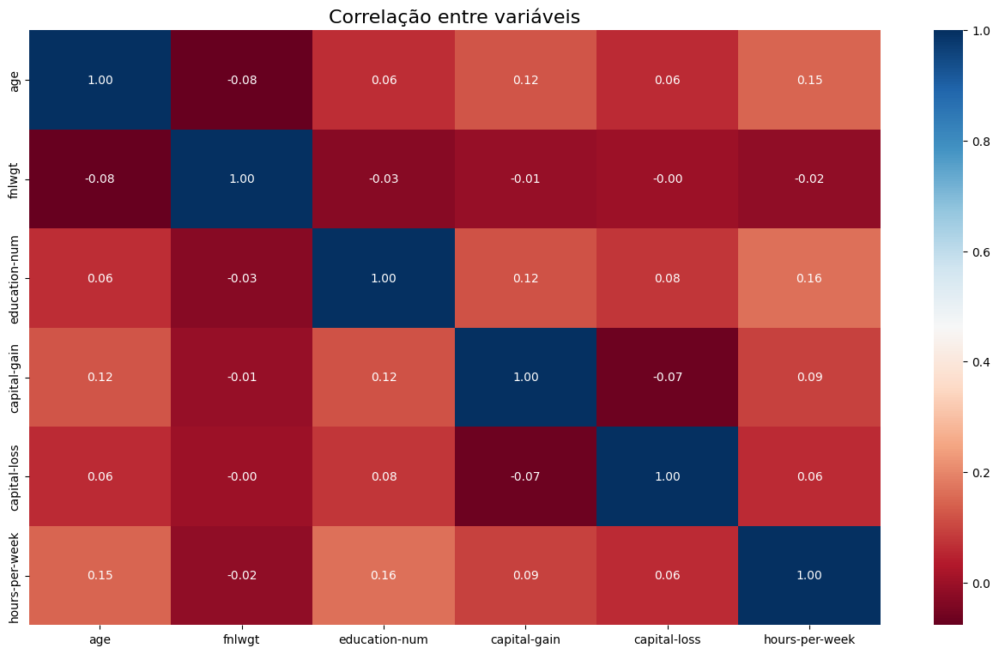

In [59]:
numericas = adult_data.select_dtypes(include=numerics)

# Calcular a matriz de correlação, é escolhido o método de Spearman por conseguir captar relações não-lineares
corr_matrix = numericas.corr(method='spearman')

# Criar o heatmap
plt.figure(figsize=(16, 9))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='RdBu')
plt.title('Correlação entre variáveis', fontsize=16)
plt.show()

O heatmap acima mostra que não existem correlações significativas entre as variáveis numéricas da base

<a id="balanceamento"></a>
<h1 style="color: green;">5. Balanceamento</h1>

Aqui, vamos verificar o quão desbalanceada está a nossa base:

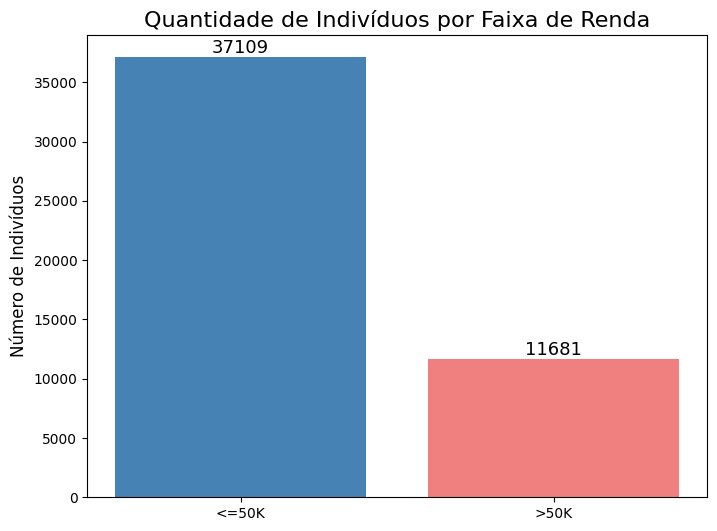

In [60]:
# Pegando os valores únicos da coluna 'class'
income = adult_data['class'].value_counts()

# Tamanho do gráfico
plt.figure(figsize=(8,6))

# Cria um gráfico de barras com índice e contagem
barra = plt.bar(
    [0, 1], 
    income.values, 
    color = ['steelblue', 'lightcoral'] 
)

# Define os rótulos do eixo x para '<=50K' e '>50K'
plt.xticks([0, 1], ['<=50K', '>50K'])

# Rotulo do eixo y, letra tamanho 8
plt.ylabel('Número de Indivíduos', fontsize = 12)

# Titulo, letra tamanho 14
plt.title('Quantidade de Indivíduos por Faixa de Renda', fontsize = 16)

# Adicionando a contagem em cima das barras
for bar in barra:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, yval, int(yval), va='bottom', ha='center', fontsize=13)

plt.grid(False)

plt.show()

In [61]:
print(f"Percebe-se que a base de dados é desbalanceada, com aproximadamente {(adult_data['class'].value_counts(1)[0]*100).round(2)}% dos indivíduos ganhando <=50K e {(adult_data['class'].value_counts(1)[1]*100).round(2)}% ganhando >50K.")

Percebe-se que a base de dados é desbalanceada, com aproximadamente 76.06% dos indivíduos ganhando <=50K e 23.94% ganhando >50K.


Agora, vamos ajustar o target para ser: `1` quando `'>50K'`, `0` quando `'<=50K'`. Vamos também definir `X_train`, `X_test`, `y_train` e `y_test`:

In [62]:
# Convertendo a variável 'class' para numérica (<=50K = 0, >50K = 1)
adult_train['class'] = adult_train['class'].apply(lambda x: 1 if x.strip() == '>50K' else 0)
adult_test['class'] = adult_test['class'].apply(lambda x: 1 if x.strip() == '>50K' else 0)

# Separando o conjunto em X e y
X_train = adult_train.drop(columns=['class'])
y_train = adult_train['class']

X_test = adult_test.drop(columns=['class'])
y_test = adult_test['class']

Em seguida, podemos criar um Pipeline para facilitar o tratamento de dados numéricos e categórios antes da aplicação de modelos de machine learning:

In [63]:
# Identificando variáveis numéricas e categóricas
num_cols = X_train.select_dtypes(exclude=['object']).columns
cat_cols = X_train.select_dtypes(include=['object']).columns

# Criando pipeline para transformações em colunas numéricas e categóricas
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median'))
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', ce.CatBoostEncoder())
])

# Combinando as transformações em um ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, num_cols),
        ('cat', categorical_transformer, cat_cols)
    ])

# Transformando os dados de treino e teste
X_train_preprocessed = pd.DataFrame(preprocessor.fit_transform(X_train, y_train), columns=X_train.columns)
X_test_preprocessed = pd.DataFrame(preprocessor.transform(X_test), columns=X_test.columns)

Para balancear dos dados, vamos utilizar o SMOTE (Synthetic Minority Over-sampling Technique). Esta técnica é mais vantajosa que o **oversampling** convencional pois balanceia o dataset de forma que reduz o risco de **overfitting**, ja que os novos registros da classe minoritária criados são gerados através de interpolação dos exemplos reais.

In [64]:
# Aplicando o SMOTE para balancear o conjunto de treino
smote = SMOTE(random_state=42)
X_train_novo, y_train_novo = smote.fit_resample(X_train_preprocessed, y_train)

# Verificando a distribuição após o balanceamento
print("Distribuição antes do balanceamento:")
print(y_train.value_counts())
print("\nDistribuição após o balanceamento:")
print(pd.Series(y_train_novo).value_counts())

Distribuição antes do balanceamento:
class
0    24720
1     7841
Name: count, dtype: int64

Distribuição após o balanceamento:
class
0    24720
1    24720
Name: count, dtype: int64


## Opção ao balanceamento: Class_Weight


No caso do class_weight, este influencia a função de perda ao aumentar a penalidade para erros nas classes minoritárias. Os pesos são calculados inversamente proporcionais à frequência das classes. Desta forma, os **class_weights** garantem que, globalmente, as classes minoritárias recebam atenção proporcional ao seu peso durante todo o treinamento.

#### Calculando class weights
```
class_weights = [sum(y_train == 1) / len(y_train), sum(y_train == 0) / len(y_train)]
```

Neste caso, `sum(y_train == 1) / len(y_train)` é o peso da **classe 1**, e sum(y_train == 0) / len(y_train) é o peso da **classe 0**.

#### CatBoost com class_weights
```
modelo = CatBoostClassifier(class_weights=class_weights, random_state=42, verbose=0)
```
